In [1]:
pip install transformers datasets scikit-learn gtts deep_translator


Note: you may need to restart the kernel to use updated packages.


In [5]:
# ==================
# Import Libraries
# ==================

import pandas as pd
import numpy as np
import os
import time
import re
import nltk
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import MultiLabelBinarizer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from deep_translator import GoogleTranslator
from gtts import gTTS
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import tkinter as tk
from tkinter import messagebox, simpledialog
import playsound

In [7]:
# ==============
# Load Dataset
# ==============

# Set dataset path
dataset_path = 'MovieSummaries/MovieSummaries/'

# Load plot summaries
plot_df = pd.read_csv(dataset_path + 'plot_summaries.txt', sep='\t', names=['MovieID', 'Summary'])

# Load metadata
meta_df = pd.read_csv(dataset_path + 'movie.metadata.tsv', sep='\t', header=None)
meta_df = meta_df[[0, 8]]  # 0: MovieID, 8: Genres
meta_df.columns = ['MovieID', 'Genres']

# Remove rows with missing genres
meta_df = meta_df.dropna()

print("Plot summaries:", plot_df.shape)
print("Metadata:", meta_df.shape)

Plot summaries: (42303, 2)
Metadata: (81741, 2)


In [9]:
# ====================================
#  Preprocessing Dataset
# ====================================


import pandas as pd
import re
import ast
import contractions  
from nltk.tokenize import wordpunct_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from collections import Counter

# ====================================
#  Text Cleaning Dataset
# ====================================

def clean_text(text):
    text = text.lower()  # Lowercase
    text = contractions.fix(text)  # Expand contractions
    text = text.replace('-', ' ')  # Replace hyphens with spaces
    
    # Separate numbers from letters
    text = re.sub(r'([a-zA-Z])(\d)', r'\1 \2', text)
    text = re.sub(r'(\d)([a-zA-Z])', r'\1 \2', text)
    
    # Remove everything except letters, numbers, and spaces
    text = re.sub(r'[^a-z0-9\s]', '', text)
    
    # Tokenize
    tokens = wordpunct_tokenize(text)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    stop_words.update({'despite'})  # add custom if needed
    tokens = [w for w in tokens if w not in stop_words]
    
    # Lemmatization
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(w) for w in tokens]
    
    return ' '.join(tokens)

# ====================================
#   Genre Extraction
# ====================================

def extract_genres(x):
    try:
        if isinstance(x, str):
            if x.startswith("{") and x.endswith("}"):
                genres_dict = ast.literal_eval(x)
                if isinstance(genres_dict, dict):
                    return list(genres_dict.values())
            elif x.startswith("[") and x.endswith("]"):
                genres_list = ast.literal_eval(x)
                if isinstance(genres_list, list):
                    return [genre.strip() for genre in genres_list]
            else:
                return [genre.strip() for genre in x.split(',')]
        else:
            return []
    except Exception:
        return []

# ====================================
#  Cleaning + Preprocessing Pipeline
# ====================================

# Step 1: Clean plot summaries
plot_df['Cleaned_Summary'] = plot_df['Summary'].apply(lambda x: clean_text(str(x)))

# Step 2: Clean genres
meta_df['Genres'] = meta_df['Genres'].apply(extract_genres)

# Step 3: Ensure MovieIDs are strings
plot_df['MovieID'] = plot_df['MovieID'].astype(str)
meta_df['MovieID'] = meta_df['MovieID'].astype(str)

# Step 4: Merge
merged_df = pd.merge(plot_df, meta_df, on='MovieID', how='inner')
merged_df = merged_df[['MovieID', 'Cleaned_Summary', 'Genres']]

# Step 5: Remove rows with no genres
merged_df = merged_df[merged_df['Genres'].map(lambda x: len(x) > 0)]

print("Before rare genre removal:", merged_df.shape)

# ====================================
#  Rare Genre Removal
# ====================================

# Count all genres
all_genres = [genre for genres_list in merged_df['Genres'] for genre in genres_list]
genre_counts = Counter(all_genres)

threshold = 5
rare_genres = {genre for genre, count in genre_counts.items() if count < threshold}

# Remove rare genres from each movie
def remove_rare_genres(genres_list):
    return [genre for genre in genres_list if genre not in rare_genres]

merged_df['Genres'] = merged_df['Genres'].apply(remove_rare_genres)

# Drop any row that becomes empty after rare genre removal
merged_df = merged_df[merged_df['Genres'].map(lambda x: len(x) > 0)]

print("After rare genre removal:", merged_df.shape)

# ====================================
#  Save Cleaned Data
# ====================================

merged_df.to_csv('cleaned_dataset.csv', index=False)
print("\nCleaned dataset saved as 'cleaned_dataset.csv'")

# Display first few rows
display(merged_df.head())

Before rare genre removal: (41793, 3)
After rare genre removal: (41788, 3)

Cleaned dataset saved as 'cleaned_dataset.csv'


,MovieID,Cleaned_Summary,Genres
0,23890098,shlykov hard working taxi driver lyosha saxoph...,"[Drama, World cinema]"
1,31186339,nation panem consists wealthy capitol twelve p...,"[Action/Adventure, Science Fiction, Action, Dr..."
2,20663735,poovalli induchoodan sentenced six year prison...,"[Musical, Action, Drama, Bollywood]"
3,2231378,lemon drop kid new york city swindler illegall...,"[Screwball comedy, Comedy]"
4,595909,seventh day adventist church pastor michael ch...,"[Crime Fiction, Drama, Docudrama, World cinema..."


In [ ]:
# ========================
# Training Model BERT
# ========================


import os
import torch
import numpy as np
import pandas as pd
import ast
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer
from transformers import DistilBertTokenizerFast, DistilBertForSequenceClassification, Trainer, TrainingArguments
from datasets import Dataset
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from gtts import gTTS
from deep_translator import GoogleTranslator
import tempfile


# ============================
#  Load and Preprocess Dataset
# ============================

df = pd.read_csv("cleaned_dataset.csv")
df['Genres'] = df['Genres'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
df = df[df['Genres'].map(lambda x: len(x) > 0)]

mlb = MultiLabelBinarizer()
y = mlb.fit_transform(df['Genres'])
df['labels'] = y.tolist()

train_texts, test_texts, train_labels, test_labels = train_test_split(
    df['Cleaned_Summary'].tolist(), y.tolist(), test_size=0.2, random_state=42
)

# ========================
#  Tokenization
# ========================

tokenizer = DistilBertTokenizerFast.from_pretrained('distilbert-base-uncased')
train_encodings = tokenizer(train_texts, truncation=True, padding=True, max_length=512)
test_encodings = tokenizer(test_texts, truncation=True, padding=True, max_length=512)

train_dataset = Dataset.from_dict({
    'input_ids': train_encodings['input_ids'],
    'attention_mask': train_encodings['attention_mask'],
    'labels': [np.array(lbl, dtype=np.float32) for lbl in train_labels]
})

test_dataset = Dataset.from_dict({
    'input_ids': test_encodings['input_ids'],
    'attention_mask': test_encodings['attention_mask'],
    'labels': [np.array(lbl, dtype=np.float32) for lbl in test_labels]
})

# ========================
#  Model
# ========================

num_labels = y.shape[1]
model = DistilBertForSequenceClassification.from_pretrained(
    'distilbert-base-uncased',
    num_labels=num_labels,
    problem_type="multi_label_classification"
)

# ========================
#  Metrics
# ========================

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    probs = torch.sigmoid(torch.tensor(logits)).numpy()
    preds = (probs > 0.5).astype(int)
    return {
        'accuracy': accuracy_score(labels, preds),
        'precision': precision_score(labels, preds, average='micro', zero_division=0),
        'recall': recall_score(labels, preds, average='micro', zero_division=0),
        'f1': f1_score(labels, preds, average='micro', zero_division=0)
    }

# ========================
# TrainingArguments
# ========================
training_args = TrainingArguments(
    output_dir='./results',
    num_train_epochs=3,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    logging_dir='./logs',
    logging_steps=100
)

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    compute_metrics=compute_metrics
)

trainer.train()
trainer.save_model("filmception_model")
tokenizer.save_pretrained("filmception_model")

metrics = trainer.evaluate()
print("\n Evaluation Metrics:")
for k, v in metrics.items():
    print(f"{k}: {v:.4f}")

In [11]:
import zipfile
import os

zip_path = "filmception_model-20250502T083354Z-1-001.zip"
extract_dir = "./filmception_model"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    for member in zip_ref.infolist():
        filename = member.filename

        # Sanitize filename for Windows
        safe_filename = filename.replace(":", "_").replace("\\", "/")
        target_path = os.path.join(extract_dir, safe_filename)

        # Create directories if needed
        os.makedirs(os.path.dirname(target_path), exist_ok=True)

        # Extract file
        with zip_ref.open(member) as source, open(target_path, "wb") as target:
            target.write(source.read())

print("Extraction complete!")


Extraction complete!


In [13]:
# ========================
# Loading save train model
# ========================

import torch
import joblib
from transformers import DistilBertTokenizerFast, DistilBertForSequenceClassification

# Load model and tokenizer from saved folder
model_path = "filmception_model"  # Path to unzipped folder
model = DistilBertForSequenceClassification.from_pretrained(model_path)
tokenizer = DistilBertTokenizerFast.from_pretrained(model_path)

# Load label binarizer
mlb = joblib.load(f"{model_path}/mlb.pkl")



C:\Users\Admin\anaconda3\Lib\site-packages\sklearn\base.py:376: InconsistentVersionWarning: Trying to unpickle estimator MultiLabelBinarizer from version 1.6.1 when using version 1.5.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [14]:
# ===============================
# Translation and audio summaries
# ===============================

import pandas as pd
from gtts import gTTS
from deep_translator import GoogleTranslator
import os

# Load the cleaned dataset
df = pd.read_csv("cleaned_dataset.csv")

# Limit to 50 summaries
summaries = df['Cleaned_Summary'].dropna().unique()[:50]

# Directory to save audios
os.makedirs("Translated_Audio", exist_ok=True)

# Define target languages
languages = {
    'ur': 'Urdu',
    'ar': 'Arabic',
    'ko': 'Korean'
}

# Translate and save audio
for i, summary in enumerate(summaries):
    for lang_code, lang_name in languages.items():
        try:
            translated = GoogleTranslator(source='auto', target=lang_code).translate(summary)
            tts = gTTS(text=translated, lang=lang_code)
            filename = f"Translated_Audio/summary_{i+1}_{lang_name}.mp3"
            tts.save(filename)
            print(f"✅ Saved: {filename}")
        except Exception as e:
            print(f"❌ Error in summary {i+1} ({lang_name}): {e}")


✅ Saved: Translated_Audio/summary_1_Urdu.mp3
✅ Saved: Translated_Audio/summary_1_Arabic.mp3
✅ Saved: Translated_Audio/summary_1_Korean.mp3
✅ Saved: Translated_Audio/summary_2_Urdu.mp3
✅ Saved: Translated_Audio/summary_2_Arabic.mp3
✅ Saved: Translated_Audio/summary_2_Korean.mp3
✅ Saved: Translated_Audio/summary_3_Urdu.mp3
✅ Saved: Translated_Audio/summary_3_Arabic.mp3
✅ Saved: Translated_Audio/summary_3_Korean.mp3
✅ Saved: Translated_Audio/summary_4_Urdu.mp3
✅ Saved: Translated_Audio/summary_4_Arabic.mp3
✅ Saved: Translated_Audio/summary_4_Korean.mp3
✅ Saved: Translated_Audio/summary_5_Urdu.mp3
✅ Saved: Translated_Audio/summary_5_Arabic.mp3
✅ Saved: Translated_Audio/summary_5_Korean.mp3
✅ Saved: Translated_Audio/summary_6_Urdu.mp3
✅ Saved: Translated_Audio/summary_6_Arabic.mp3
✅ Saved: Translated_Audio/summary_6_Korean.mp3
✅ Saved: Translated_Audio/summary_7_Urdu.mp3
✅ Saved: Translated_Audio/summary_7_Arabic.mp3
✅ Saved: Translated_Audio/summary_7_Korean.mp3
✅ Saved: Translated_Audio/s

In [15]:
# ========================
#  Train Test Split
# ========================

import pandas as pd
import numpy as np
import ast
from sklearn.model_selection import train_test_split
import joblib

# Load cleaned dataset
df = pd.read_csv("cleaned_dataset.csv")
df['Genres'] = df['Genres'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
df = df[df['Genres'].map(lambda x: len(x) > 0)]

y = mlb.transform(df['Genres'])

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    df['Cleaned_Summary'], y, test_size=0.2, random_state=42
)




In [17]:
# ========================
#  Evaluation Metrics
# ========================

import torch
import numpy as np
from sklearn.metrics import classification_report, f1_score, accuracy_score, precision_score, recall_score
from tqdm import tqdm


model.eval()

# Batched Predictions
batch_size = 16
X_test_list = X_test.tolist()
y_true = np.array(y_test)
y_probs = []

for i in tqdm(range(0, len(X_test_list), batch_size)):
    batch_texts = X_test_list[i:i+batch_size]
    batch_enc = tokenizer(batch_texts, return_tensors='pt', padding=True, truncation=True, max_length=512)
    
    with torch.no_grad():
        batch_outputs = model(**batch_enc)
        batch_logits = batch_outputs.logits
        batch_probs = torch.sigmoid(batch_logits).numpy()
        y_probs.append(batch_probs)

y_probs = np.vstack(y_probs)

# Define under-predicted genres
under_predicted = {
    'Animation': 0.35,
    'Fantasy': 0.4,
    'Adventure': 0.4,
    'Action': 0.4,
    'Sci-Fi': 0.4,
    'Superhero': 0.35,
    'Romantic drama': 0.35
}

# Threshold Tuning
thresholds = []
for i in range(y_true.shape[1]):
    best_thresh, best_f1 = 0.5, 0
    for t in np.arange(0.1, 0.9, 0.05):
        pred = (y_probs[:, i] > t).astype(int)
        f1 = f1_score(y_true[:, i], pred, zero_division=0)
        if f1 > best_f1:
            best_f1 = f1
            best_thresh = t

    genre = mlb.classes_[i]
    if genre in under_predicted:
        best_thresh = min(best_thresh, under_predicted[genre])  # Lower threshold slightly for under-detected genres
    thresholds.append(best_thresh)

# Predict with adjusted thresholds
y_pred_tuned = np.array([
    (y_probs[:, i] > thresholds[i]).astype(int)
    for i in range(len(thresholds))
]).T

# Final Evaluation
print("\n Evaluation Metrics :")
print(f"Accuracy : {accuracy_score(y_true, y_pred_tuned):.4f}")
print(f"Precision: {precision_score(y_true, y_pred_tuned, average='micro', zero_division=0):.4f}")
print(f"Recall   : {recall_score(y_true, y_pred_tuned, average='micro', zero_division=0):.4f}")
print(f"F1 Score : {f1_score(y_true, y_pred_tuned, average='micro', zero_division=0):.4f}")

# Step 6: Top-15 Genre Report
top_15_indices = np.argsort(np.sum(y_true, axis=0))[-15:][::-1]
top_15_labels = [mlb.classes_[i] for i in top_15_indices]

print("\n Top 15 Genre Classification Report:")
print(classification_report(
    y_true[:, top_15_indices],
    y_pred_tuned[:, top_15_indices],
    target_names=top_15_labels,
    zero_division=0
))



100%|██████████| 523/523 [47:38<00:00,  5.47s/it]  



 Evaluation Metrics :
Accuracy : 0.0443
Precision: 0.4570
Recall   : 0.5607
F1 Score : 0.5036

 Top 15 Genre Classification Report:
                  precision    recall  f1-score   support

           Drama       0.64      0.87      0.74      3781
          Comedy       0.57      0.72      0.64      2139
    Romance Film       0.43      0.73      0.54      1327
        Thriller       0.58      0.62      0.60      1326
          Action       0.51      0.73      0.60      1203
    World cinema       0.45      0.54      0.49      1035
   Crime Fiction       0.51      0.66      0.57       908
          Horror       0.81      0.75      0.78       812
           Indie       0.31      0.39      0.34       752
 Black-and-white       0.43      0.54      0.48       750
Action/Adventure       0.48      0.60      0.53       722
      Short Film       0.83      0.61      0.70       646
       Adventure       0.42      0.63      0.51       642
     Family Film       0.59      0.56      0.58       

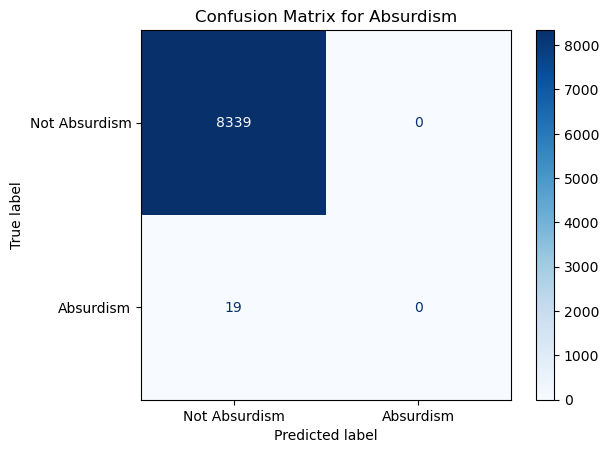

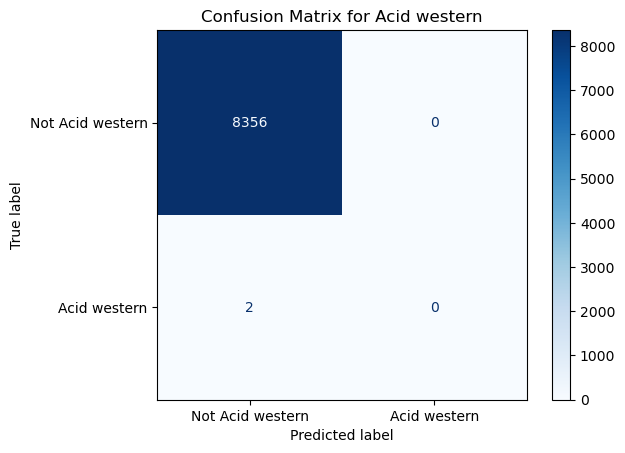

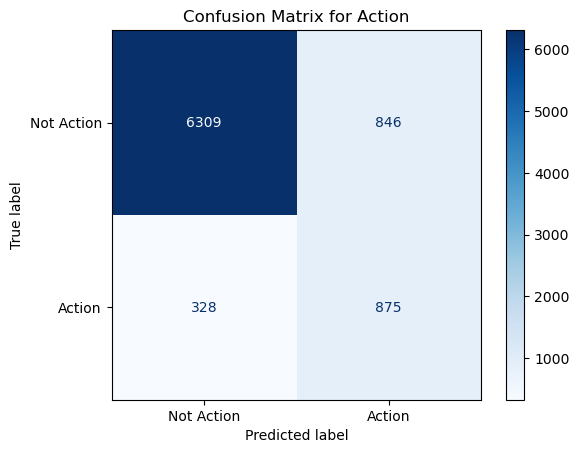

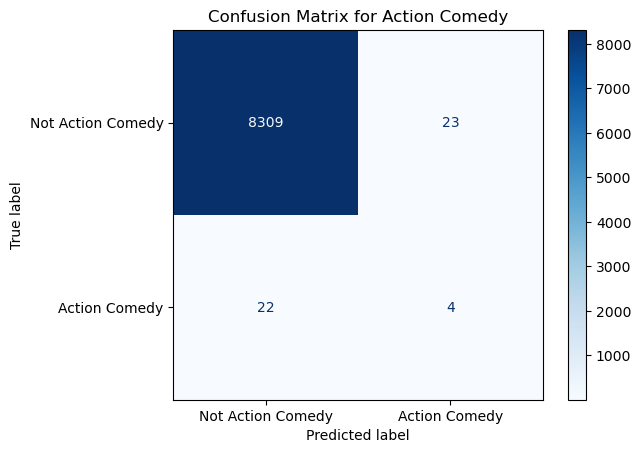

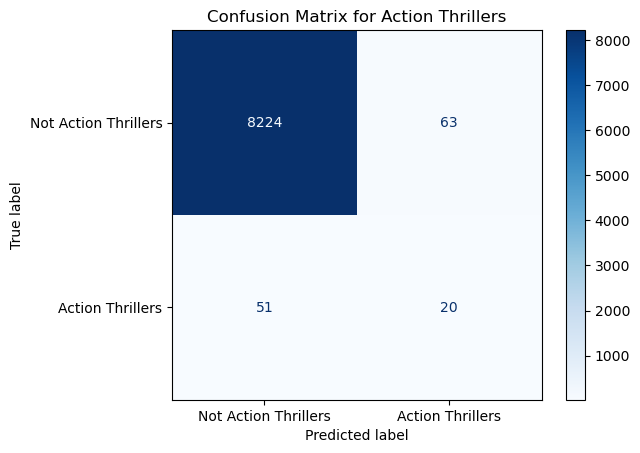

...

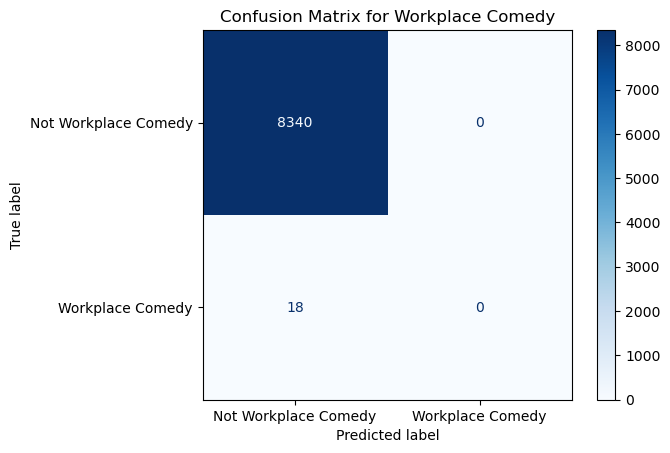

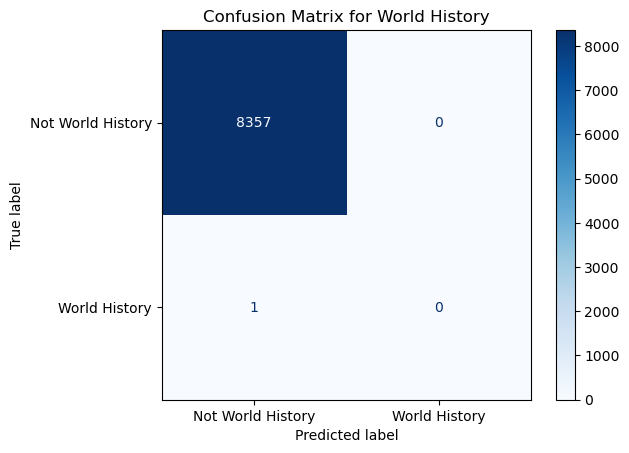

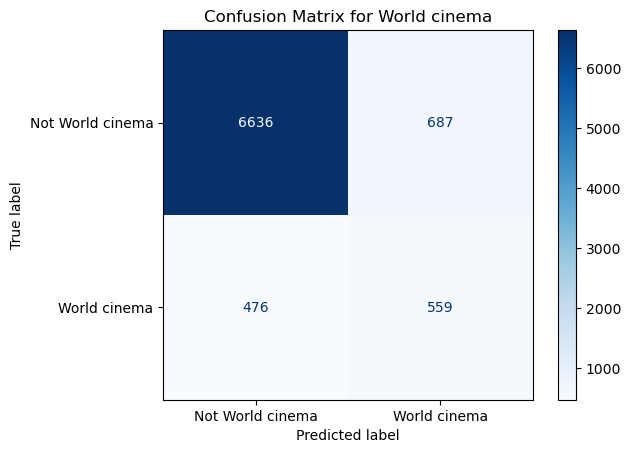

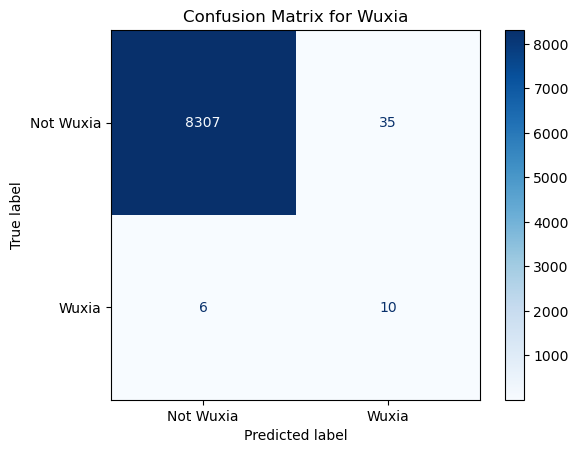

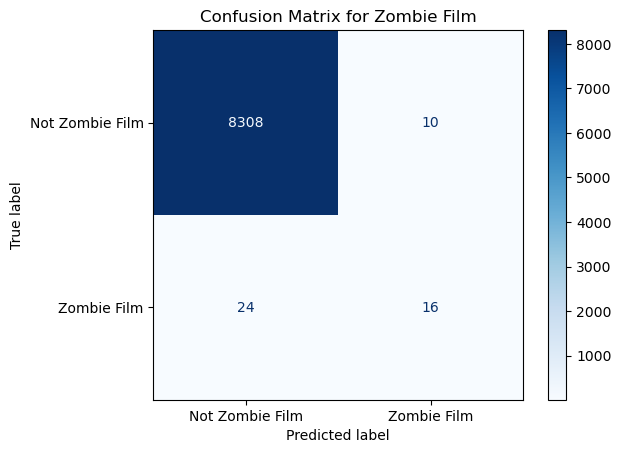

In [19]:
# ================================
#  Visualizations Confusion Matrix
# ================================

from sklearn.metrics import multilabel_confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Compute multilabel confusion matrix
mcm = multilabel_confusion_matrix(y_true, y_pred_tuned)

# Plot confusion matrix for each genre
for i, (label, matrix) in enumerate(zip(mlb.classes_, mcm)):
    disp = ConfusionMatrixDisplay(confusion_matrix=matrix, display_labels=[f'Not {label}', label])
    disp.plot(cmap=plt.cm.Blues)
    plt.title(f'Confusion Matrix for {label}')
    plt.show()


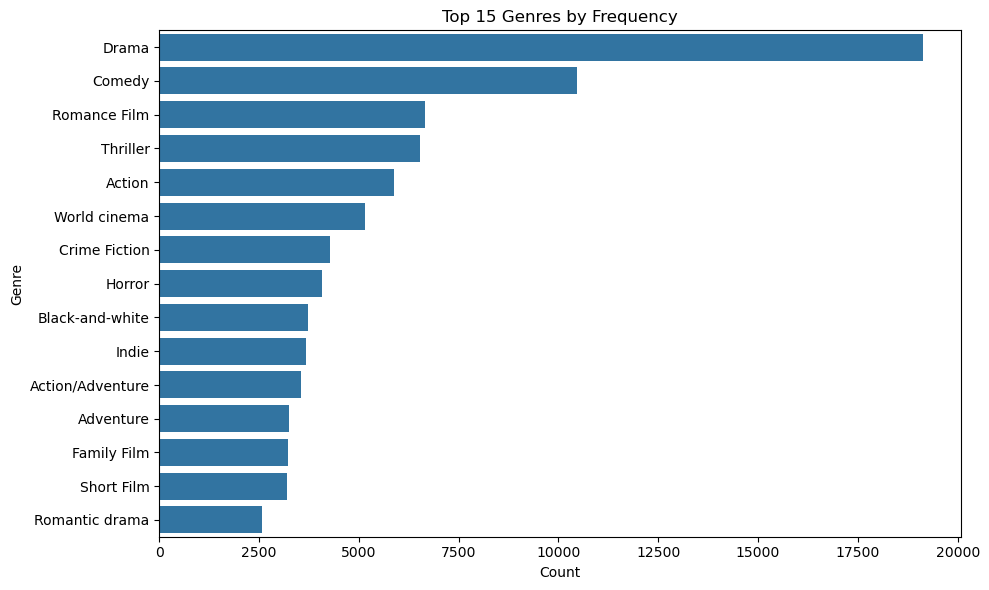

In [21]:
# ========================
# Visualization Bar chart
# ========================

import matplotlib.pyplot as plt
import seaborn as sns

# Top 15 genres
genre_counts = df['Genres'].explode().value_counts().nlargest(15)

# Plotting without palette
plt.figure(figsize=(10, 6))
sns.barplot(x=genre_counts.values, y=genre_counts.index)
plt.title("Top 15 Genres by Frequency")
plt.xlabel("Count")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()


In [23]:
# ============================
#  Saved Tuned Model Trained
# ===========================

import joblib
joblib.dump(thresholds, "filmception_model/thresholds.pkl")

['filmception_model/thresholds.pkl']

In [25]:
# ========================
#          GUI 
# ========================

import tkinter as tk
from tkinter import messagebox, ttk
from deep_translator import GoogleTranslator
from gtts import gTTS
import tempfile
import os
import torch
from datetime import datetime
import joblib

# Load saved thresholds
thresholds = joblib.load("filmception_model/thresholds.pkl")


# ========================
#  Predict Genres
# ========================

def predict_genres(summary):
    inputs = tokenizer(summary, return_tensors="pt", truncation=True, padding=True, max_length=512)
    outputs = model(**inputs)
    probs = torch.sigmoid(outputs.logits).detach().numpy()[0]

    # Apply individual thresholds
    preds = (probs > thresholds).astype(int)

    # Return only genre names (no scores)
    predicted = [genre for i, genre in enumerate(mlb.classes_) if preds[i] == 1]
    return predicted


# ===========================
#  Translate and Save Audio
# ===========================


def translate_and_speak(text, lang_code):
    try:
        translated = GoogleTranslator(source='auto', target=lang_code).translate(text)
        tts = gTTS(text=translated, lang=lang_code)
        filename = f"Translated_Audio/summary_{lang_code}_{datetime.now().strftime('%Y%m%d_%H%M%S')}.mp3"
        tts.save(filename)
        playsound.playsound(filename)
        messagebox.showinfo("Success", f"🎧 Audio saved and played: {filename}")
    except Exception as e:
        messagebox.showerror("Translation Error", str(e))


def create_gui():
    window = tk.Tk()
    window.title("🎬 Filmception - Genre & Audio Summary")
    window.geometry("700x550")
    window.configure(bg="#f5f7fa")

    # Fonts and Styles
    title_font = ("Helvetica", 18, "bold")
    label_font = ("Helvetica", 12)
    button_font = ("Helvetica", 11, "bold")

    # ============ Menu Bar ============
    menu_bar = tk.Menu(window)
    window.config(menu=menu_bar)

    # Options Menu
    options_menu = tk.Menu(menu_bar, tearoff=0)
    menu_bar.add_cascade(label="Options", menu=options_menu)

    def predict_from_menu():
        on_predict()

    def translate_urdu():
        on_translate("ur")

    def translate_arabic():
        on_translate("ar")

    def translate_korean():
        on_translate("ko")

    options_menu.add_command(label="Predict Genre", command=predict_from_menu)
    options_menu.add_command(label="Translate in Urdu", command=translate_urdu)
    options_menu.add_command(label="Translate in Arabic", command=translate_arabic)
    options_menu.add_command(label="Translate in Korean", command=translate_korean)
    options_menu.add_separator()
    options_menu.add_command(label="Exit", command=window.quit)

    # Title
    tk.Label(window, text="🎬 Filmception", font=title_font, fg="#2b2d42", bg="#f5f7fa").pack(pady=10)
    tk.Label(window, text="Enter a Movie Summary Below", font=label_font, bg="#f5f7fa").pack()

    # Input Text Box
    input_text = tk.Text(window, height=8, wrap=tk.WORD, font=("Helvetica", 11))
    input_text.pack(padx=15, pady=10, fill=tk.BOTH, expand=False)

    # Predict Button
    def on_predict():
        summary = input_text.get("1.0", tk.END).strip()
        if not summary:
            messagebox.showwarning("Input Missing", "Please enter a movie summary.")
            return
        try:
            genres = predict_genres(summary)
            result_var.set(", ".join(genres) if genres else "No genres predicted.")
        except Exception as e:
            messagebox.showerror("Prediction Error", f"An error occurred during prediction:\n{e}")

    predict_btn = tk.Button(window, text="🎯 Predict Genres", font=button_font, bg="#118ab2", fg="white", command=on_predict)
    predict_btn.pack(pady=10)

    # Prediction Result
    result_var = tk.StringVar()
    tk.Label(window, text="Predicted Genres:", font=label_font, bg="#f5f7fa").pack()
    tk.Label(window, textvariable=result_var, font=("Helvetica", 11), fg="#073b4c", wraplength=600, bg="#f5f7fa").pack(pady=5)

    # Translation Section
    tk.Label(window, text="🔊 Translate & Listen", font=label_font, bg="#f5f7fa").pack(pady=10)

    def on_translate(lang_code):
        summary = input_text.get("1.0", tk.END).strip()
        if not summary:
            messagebox.showwarning("Input Missing", "Please enter a movie summary first.")
            return
        try:
            translate_and_speak(summary, lang_code)
        except Exception as e:
            messagebox.showerror("Translation Error", f"An error occurred during translation/audio:\n{e}")

    # Translation Buttons
    btn_frame = tk.Frame(window, bg="#f5f7fa")
    btn_frame.pack(pady=5)

    ttk.Style().configure("TButton", font=("Helvetica", 10))

    ttk.Button(btn_frame, text="Urdu", command=lambda: on_translate("ur")).grid(row=0, column=0, padx=10, ipadx=10, ipady=3)
    ttk.Button(btn_frame, text="Arabic", command=lambda: on_translate("ar")).grid(row=0, column=1, padx=10, ipadx=10, ipady=3)
    ttk.Button(btn_frame, text="Korean", command=lambda: on_translate("ko")).grid(row=0, column=2, padx=10, ipadx=10, ipady=3)

    # Start GUI Loop
    window.mainloop()


# ========================
#  Launch GUI
# ========================

create_gui()
